# Deconvolute merged sci-Space embryo data (Fig 2 and Fig S14)

In [1]:
import os
import warnings
import torch
import numpy as np
import scipy as sp
import scipy.io as sio
import pandas as pd
from sklearn.metrics import roc_auc_score, average_precision_score
from smoother import SpatialWeightMatrix, SpatialLoss
from smoother.models.deconv import NNLS, NuSVR, DWLS, LogNormReg
from smoother.visualization import *

import matplotlib
import matplotlib.pyplot as plt
from plotnine import *
from plotnine_prism import *

In [2]:
DATA_FOLDER = "/Users/jysumac/Projects/Smoother_paper/data/synthetic_deconv/sci_space/deconv_inputs/"
RES_FOLDER = "/Users/jysumac/Projects/Smoother_paper/results/synthetic_deconv/sci_space/"

pal = ['#E64B35', '#4DBBD5', '#00A087', '#3C5488', '#F39B7F', '#8491B4', '#91D1C2', '#DC0000', '#7E6148', '#B09C85']
from plotnine.scales.scale import scale_discrete
class scale_fill_npg(scale_discrete):
    """GGSCI-NPG fill scale
    Args:
        palette: The fill palette name
    """

    _aesthetics = ["fill"]
    na_value = "#7F7F7F"

    def __init__(self, palette="colors", **kwargs):
        """Construct"""
        self.palette = lambda n: pal[:n]
        scale_discrete.__init__(self, **kwargs)

## Deconvolute one slide

### Load preprocessed data

In [3]:
# change the data directory accordingly
S_ID = "slide_11"

# spatial counts
sp_counts = sio.mmread(
    f"{DATA_FOLDER}/{S_ID}/syn_sp_count_markers.mtx"
).toarray().T

# reference count matrices
ref_raw_counts = pd.read_csv(
    f"{DATA_FOLDER}/ref_avg_raw_count_markers.csv", header = 0, index_col = 0)
celltypes = ref_raw_counts.columns

ref_norm_counts = pd.read_csv(
    f"{DATA_FOLDER}/ref_avg_norm_count_markers.csv", header = 0, index_col = 0)
ref_norm_counts = ref_norm_counts[celltypes]

# spatial coordinates, num_spot x 2
meta = pd.read_csv(f"{DATA_FOLDER}/{S_ID}/meta_grids.csv", sep = ",", header=0, index_col=0)
coords = meta.loc[:, ['Row', 'Col']]


# true celltype abundances
ct_abundances_true = torch.tensor(meta.loc[:, celltypes].values)

p_true = ct_abundances_true / ct_abundances_true.sum(1, keepdims = True)

print(f"Number of genes: {ref_norm_counts.shape[0]}")
print(f"Number of celltypes: {ref_norm_counts.shape[1]}")
print(f"Number of spots: {sp_counts.shape[1]}")

# convert data into torch tensor
x_raw_c = torch.tensor(ref_raw_counts.values).float()
x_norm_c = torch.tensor(ref_norm_counts.values).float()
y_c = torch.tensor(sp_counts).float()


x_raw_lc = torch.log1p(x_raw_c)
x_norm_lc = torch.log1p(x_norm_c)
y_lc = torch.log1p(y_c)

Number of genes: 298
Number of celltypes: 8
Number of spots: 925


### Check data properties

#### Check number of cells per spot

In [4]:
np.unique((p_true > 0).sum(1), return_counts = True)

(array([1, 2, 3, 4, 5, 6, 7]), array([ 54, 238, 350, 199,  71,  11,   2]))

#### Check abundance pattern

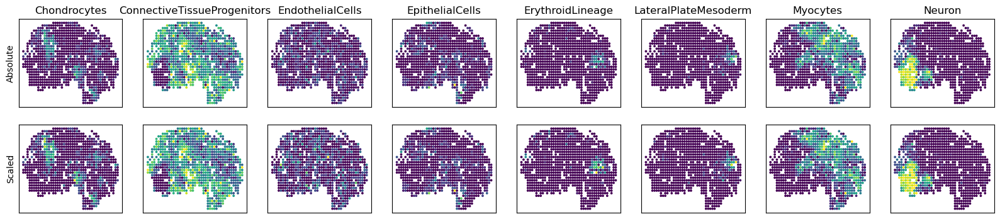

In [5]:
# visualize
ct_to_plot = celltypes
ct_idx = [np.nonzero(celltypes == ct)[0] for ct in ct_to_plot]

# visualization
# colored by coefficients layer-by-layer
fig, axs = plt.subplots(2, len(ct_idx), figsize=(2.5*len(ct_idx), 4))

for i, idx in enumerate(ct_idx):
    axs[0][i].scatter(coords['Col'], coords['Row'], c = p_true[:,idx], s = 3, vmin=0, vmax=1)
    axs[0][i].set_title(ct_to_plot[i])
    axs[1][i].scatter(coords['Col'], coords['Row'], c = p_true[:,idx], s = 3)
    
axs[0][0].set_ylabel('Absolute')
axs[1][0].set_ylabel('Scaled')

for ax in axs.flatten():
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()

### Test different deconvolution preprocessing strategies

#### Raw reference + log-scale

In [6]:
torch.manual_seed(20220801)

# calculate spatial weight matrix
weights = SpatialWeightMatrix()
weights.calc_weights_knn(coords)
weights.scale_by_expr(y_lc)

# prepare spatial loss
spatial_loss = SpatialLoss('icar', weights, rho = 0.99)

# deconvolution
method_names = ['NNLS', 'NNLS + spatial',
                'SVR', 'SVR + spatial',
                'DWLS', 'DWLS + spatial',
                'LNR', 'LNR + spatial']

deconv_configs = {'max_epochs':-1, 'lr':1e-2, 'verbose':False}

# NNLS
nnls_wo_ss = NNLS()
nnls_wo_ss.deconv(x_raw_lc, y_lc, None, lambda_spatial_loss=0, **deconv_configs)
nnls_w_ss = NNLS()
nnls_w_ss.deconv(x_raw_lc, y_lc, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

# Nu-SVR
svr_wo_ss = NuSVR(nonneg=True, nu=0.5)
svr_wo_ss.deconv(x_raw_lc, y_lc, None, lambda_spatial_loss=0, **deconv_configs)
svr_w_ss = NuSVR(nonneg=True, nu=0.5)
svr_w_ss.deconv(x_raw_lc, y_lc, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

# DWLS
dwls_wo_ss = DWLS(nonneg=True, max_weights=4)
dwls_wo_ss.deconv(x_raw_lc, y_lc, None, lambda_spatial_loss=0, **deconv_configs)
dwls_w_ss = DWLS(nonneg=True, max_weights=4)
dwls_w_ss.deconv(x_raw_lc, y_lc, spatial_loss, lambda_spatial_loss=3, **deconv_configs)

# LogNormRegression
lnr_wo_ss = LogNormReg()
lnr_wo_ss.deconv(x_raw_c, y_c, None, lambda_spatial_loss=0, **deconv_configs)
lnr_w_ss = LogNormReg()
lnr_w_ss.deconv(x_raw_c, y_c, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

# merge and extract results
deconv_models = [nnls_wo_ss, nnls_w_ss,
                 svr_wo_ss, svr_w_ss,
                 dwls_wo_ss, dwls_w_ss,
                 lnr_wo_ss, lnr_w_ss]

prop_inf = [m.get_props().numpy() for m in deconv_models]

Number of spots: 925. Average number of neighbors per spot:  5.02.
Number of spots: 925. Average number of neighbors per spot:  5.03.
=== Time  0.09s. Total epoch 101. Final loss: (total) 0.128. (spatial) 0.000.
=== Time  0.11s. Total epoch 117. Final loss: (total) 0.131. (spatial) 0.002.
=== Time  0.22s. Total epoch 134. Final loss: (total) 0.135. (spatial) 0.000.
=== Time  0.26s. Total epoch 134. Final loss: (total) 0.137. (spatial) 0.001.
=== Time  0.17s. Total epoch 152. Final loss: (total) 0.358. (spatial) 0.000.
=== Time  0.26s. Total epoch 168. Final loss: (total) 0.365. (spatial) 0.004.
=== Time  1.64s. Total epoch 1265. Final loss: (total) 0.149. (spatial) 0.000.
=== Time  9.13s. Total epoch 5425. Final loss: (total) 0.139. (spatial) 0.006.


#### Normalized reference + log-scale

In [7]:
torch.manual_seed(20220801)

# calculate spatial weight matrix
weights = SpatialWeightMatrix()
weights.calc_weights_knn(coords)
weights.scale_by_expr(y_lc)

# prepare spatial loss
spatial_loss = SpatialLoss('icar', weights, rho = 0.99)

# deconvolution
method_names += ['NNLS-N', 'NNLS-N + spatial',
                'SVR-N', 'SVR-N + spatial',
                'DWLS-N', 'DWLS-N + spatial',
                'LNR-N', 'LNR-N + spatial']

deconv_configs = {'max_epochs':-1, 'lr':1e-2, 'verbose':False}

# NNLS
nnls_wo_ss = NNLS()
nnls_wo_ss.deconv(x_norm_lc, y_lc, None, lambda_spatial_loss=0, **deconv_configs)
nnls_w_ss = NNLS()
nnls_w_ss.deconv(x_norm_lc, y_lc, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

# Nu-SVR
svr_wo_ss = NuSVR(nonneg=True, nu=0.5)
svr_wo_ss.deconv(x_norm_lc, y_lc, None, lambda_spatial_loss=0, **deconv_configs)
svr_w_ss = NuSVR(nonneg=True, nu=0.5)
svr_w_ss.deconv(x_norm_lc, y_lc, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

# DWLS
dwls_wo_ss = DWLS(nonneg=True, max_weights=4)
dwls_wo_ss.deconv(x_norm_lc, y_lc, None, lambda_spatial_loss=0, **deconv_configs)
dwls_w_ss = DWLS(nonneg=True, max_weights=4)
dwls_w_ss.deconv(x_norm_lc, y_lc, spatial_loss, lambda_spatial_loss=3, **deconv_configs)

lnr_wo_ss = LogNormReg()
lnr_wo_ss.deconv(x_norm_c, y_c, None, lambda_spatial_loss=0, **deconv_configs)
lnr_w_ss = LogNormReg()
lnr_w_ss.deconv(x_norm_c, y_c, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

# merge and extract results
deconv_models = [nnls_wo_ss, nnls_w_ss,
                 svr_wo_ss, svr_w_ss,
                 dwls_wo_ss, dwls_w_ss,
                 lnr_wo_ss, lnr_w_ss]

prop_inf += [m.get_props().numpy() for m in deconv_models]

Number of spots: 925. Average number of neighbors per spot:  5.02.
Number of spots: 925. Average number of neighbors per spot:  5.03.
=== Time  0.06s. Total epoch 85. Final loss: (total) 0.128. (spatial) 0.000.
=== Time  0.07s. Total epoch 79. Final loss: (total) 0.130. (spatial) 0.001.
=== Time  0.20s. Total epoch 123. Final loss: (total) 0.135. (spatial) 0.000.
=== Time  0.24s. Total epoch 123. Final loss: (total) 0.136. (spatial) 0.001.
=== Time  0.12s. Total epoch 109. Final loss: (total) 0.357. (spatial) 0.000.
=== Time  0.14s. Total epoch 94. Final loss: (total) 0.361. (spatial) 0.002.
=== Time  0.48s. Total epoch 355. Final loss: (total) 0.145. (spatial) 0.000.
=== Time  1.07s. Total epoch 643. Final loss: (total) 0.153. (spatial) 0.014.


#### Raw reference + raw counts

In [8]:
# convert data into torch tensor
x_raw_c = torch.tensor(ref_raw_counts.values).float()
y_c = torch.tensor(sp_counts).float()
norm_factor = y_c.mean() * 10
y_c = y_c / norm_factor
x_raw_c = x_raw_c / norm_factor

In [9]:
torch.manual_seed(20220801)

# calculate spatial weight matrix
weights = SpatialWeightMatrix()
weights.calc_weights_knn(coords)
weights.scale_by_expr(y_c)

# prepare spatial loss
spatial_loss = SpatialLoss('icar', weights, rho = 0.99)

# deconvolution
method_names += ['NNLS-RC', 'NNLS-RC + spatial',
                'SVR-RC', 'SVR-RC + spatial',
                'DWLS-RC', 'DWLS-RC + spatial',
                'LNR-RC', 'LNR-RC + spatial']

deconv_configs = {'max_epochs':-1, 'lr':1e-2, 'verbose':False}

# NNLS
nnls_wo_ss = NNLS()
nnls_wo_ss.deconv(x_raw_c, y_c, None, lambda_spatial_loss=0, **deconv_configs)
nnls_w_ss = NNLS()
nnls_w_ss.deconv(x_raw_c, y_c, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

# Nu-SVR
svr_wo_ss = NuSVR(nonneg=True, nu=0.5)
svr_wo_ss.deconv(x_raw_c, y_c, None, lambda_spatial_loss=0, **deconv_configs)
svr_w_ss = NuSVR(nonneg=True, nu=0.5)
svr_w_ss.deconv(x_raw_c, y_c, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

# DWLS
dwls_wo_ss = DWLS(nonneg=True, max_weights=4)
dwls_wo_ss.deconv(x_raw_c, y_c, None, lambda_spatial_loss=0, **deconv_configs)
dwls_w_ss = DWLS(nonneg=True, max_weights=4)
dwls_w_ss.deconv(x_raw_c, y_c, spatial_loss, lambda_spatial_loss=3, **deconv_configs)

# LogNormRegression
lnr_wo_ss = LogNormReg()
lnr_wo_ss.deconv(x_raw_c, y_c, None, lambda_spatial_loss=0, **deconv_configs)
lnr_w_ss = LogNormReg()
lnr_w_ss.deconv(x_raw_c, y_c, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

# merge and extract results
deconv_models = [nnls_wo_ss, nnls_w_ss,
                 svr_wo_ss, svr_w_ss,
                 dwls_wo_ss, dwls_w_ss,
                 lnr_wo_ss, lnr_w_ss]

prop_inf += [m.get_props().numpy() for m in deconv_models]

Number of spots: 925. Average number of neighbors per spot:  5.02.
Number of spots: 925. Average number of neighbors per spot:  5.04.
=== Time  2.59s. Total epoch 4191. Final loss: (total) 0.668. (spatial) 0.000.
=== Time  4.57s. Total epoch 4840. Final loss: (total) 0.686. (spatial) 0.023.
=== Time  5.21s. Total epoch 3255. Final loss: (total) 0.791. (spatial) 0.000.
=== Time  8.01s. Total epoch 3881. Final loss: (total) 0.780. (spatial) 0.047.
=== Time  6.44s. Total epoch 5467. Final loss: (total) 0.953. (spatial) 0.000.
=== Time  8.92s. Total epoch 5593. Final loss: (total) 0.967. (spatial) 0.015.
=== Time  1.47s. Total epoch 1123. Final loss: (total) 0.043. (spatial) 0.000.
=== Time  9.98s. Total epoch 5957. Final loss: (total) 0.040. (spatial) 0.004.


#### Raw reference + sqrt-scale

In [10]:
# convert data into torch tensor
x_raw_c = torch.tensor(ref_norm_counts.values).float()
y_c = torch.tensor(sp_counts).float()
x_raw_sqrt = torch.sqrt(x_raw_c)
y_sqrt = torch.sqrt(y_c)

In [11]:
torch.manual_seed(20220801)

# calculate spatial weight matrix
weights = SpatialWeightMatrix()
weights.calc_weights_knn(coords)
weights.scale_by_expr(y_sqrt)

# prepare spatial loss
spatial_loss = SpatialLoss('icar', weights, rho = 0.99)

# deconvolution
method_names += ['NNLS-S', 'NNLS-S + spatial',
                'SVR-S', 'SVR-S + spatial',
                'DWLS-S', 'DWLS-S + spatial']

deconv_configs = {'max_epochs':-1, 'lr':1e-2, 'verbose':False}

# NNLS
nnls_wo_ss = NNLS()
nnls_wo_ss.deconv(x_raw_sqrt, y_sqrt, None, lambda_spatial_loss=0, **deconv_configs)
nnls_w_ss = NNLS()
nnls_w_ss.deconv(x_raw_sqrt, y_sqrt, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

# Nu-SVR
svr_wo_ss = NuSVR(nonneg=True, nu=0.5)
svr_wo_ss.deconv(x_raw_sqrt, y_sqrt, None, lambda_spatial_loss=0, **deconv_configs)
svr_w_ss = NuSVR(nonneg=True, nu=0.5)
svr_w_ss.deconv(x_raw_sqrt, y_sqrt, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

# DWLS
dwls_wo_ss = DWLS(nonneg=True, max_weights=4)
dwls_wo_ss.deconv(x_raw_sqrt, y_sqrt, None, lambda_spatial_loss=0, **deconv_configs)
dwls_w_ss = DWLS(nonneg=True, max_weights=4)
dwls_w_ss.deconv(x_raw_sqrt, y_sqrt, spatial_loss, lambda_spatial_loss=3, **deconv_configs)

# merge and extract results
deconv_models = [nnls_wo_ss, nnls_w_ss,
                 svr_wo_ss, svr_w_ss,
                 dwls_wo_ss, dwls_w_ss]

prop_inf += [m.get_props().numpy() for m in deconv_models]

Number of spots: 925. Average number of neighbors per spot:  5.02.
Number of spots: 925. Average number of neighbors per spot:  5.03.
=== Time  0.08s. Total epoch 120. Final loss: (total) 0.271. (spatial) 0.000.
=== Time  0.12s. Total epoch 126. Final loss: (total) 0.273. (spatial) 0.002.
=== Time  0.23s. Total epoch 134. Final loss: (total) 0.274. (spatial) 0.000.
=== Time  0.29s. Total epoch 141. Final loss: (total) 0.276. (spatial) 0.002.
=== Time  0.19s. Total epoch 166. Final loss: (total) 0.724. (spatial) 0.000.
=== Time  0.28s. Total epoch 184. Final loss: (total) 0.728. (spatial) 0.004.


### Evaluate deconvolution performance

#### Plot inferred cell type proportions

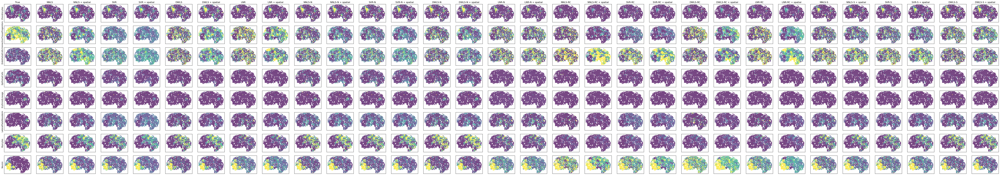

In [12]:
ct_to_plot = celltypes
ct_idx = [np.nonzero(celltypes == ct)[0].item() for ct in ct_to_plot]

# visualization
# colored by coefficients layer-by-layer
fig, axes = plt.subplots(
    len(ct_idx), len(method_names) + 1, 
    figsize=(3*(len(method_names) + 1), 2*len(ct_idx))
)
for i, idx in enumerate(ct_idx):
    if len(ct_idx) == 1:
        ax = axes
    else:
        ax = axes[i]
    ax[0].scatter(coords['Col'], coords['Row'], c = p_true[:,idx], s = 3, vmin=0, vmax=0.6)
    
    for m, name in enumerate(method_names):
        ax[1 + m].scatter(coords['Col'], coords['Row'], c = prop_inf[m][:, idx], s = 3, vmin=0, vmax=0.6)
        if i == 0:
            ax[1 + m].set_title(name)
    
    ax[0].set_ylabel(celltypes[idx])

if len(ct_idx) == 1:
    ax = axes
else:
    ax = axes[0]
ax[0].set_title("True")

for ax in axes.flatten():
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()

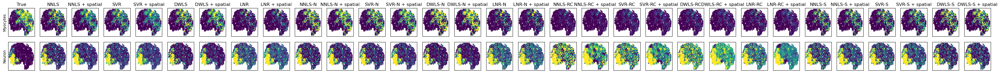

In [13]:
ct_to_plot = ['Myocytes', 'Neuron']
ct_idx = [np.nonzero(celltypes == ct)[0].item() for ct in ct_to_plot]

# visualization
# colored by coefficients layer-by-layer
fig, axes = plt.subplots(
    len(ct_idx), len(method_names) + 1, 
    figsize=(1.5*(len(method_names) + 1), 1.5*len(ct_idx))
)
for i, idx in enumerate(ct_idx):
    if len(ct_idx) == 1:
        ax = axes
    else:
        ax = axes[i]
    ax[0].scatter(coords['Col'], coords['Row'], c = p_true[:,idx], s = 3, vmin=0, vmax=0.6)
    
    for m, name in enumerate(method_names):
        ax[1 + m].scatter(coords['Col'], coords['Row'], c = prop_inf[m][:, idx], s = 3, vmin=0, vmax=0.6)
        if i == 0:
            ax[1 + m].set_title(name)
    
    ax[0].set_ylabel(ct_to_plot[i])

if len(ct_idx) == 1:
    ax = axes
else:
    ax = axes[0]
ax[0].set_title("True")

for ax in axes.flatten():
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()

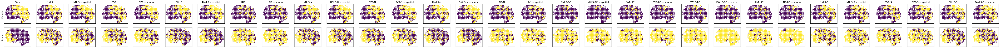

In [14]:
ct_to_plot = ['Myocytes', 'Neuron']
ct_idx = [np.nonzero(celltypes == ct)[0].item() for ct in ct_to_plot]

# visualization
# colored by coefficients layer-by-layer
fig, axes = plt.subplots(
    len(ct_idx), len(method_names) + 1, 
    figsize=(3*(len(method_names) + 1), 2*len(ct_idx))
)
for i, idx in enumerate(ct_idx):
    if len(ct_idx) == 1:
        ax = axes
    else:
        ax = axes[i]
    ax[0].scatter(coords['Col'], coords['Row'], c = p_true[:,idx] > 0.1, s = 3, vmin=0, vmax=0.6)
    
    for m, name in enumerate(method_names):
        ax[1 + m].scatter(coords['Col'], coords['Row'], c = prop_inf[m][:, idx] > 0.1, s = 3, vmin=0, vmax=0.6)
        if i == 0:
            ax[1 + m].set_title(name)
    
    ax[0].set_ylabel(ct_to_plot[i])

if len(ct_idx) == 1:
    ax = axes
else:
    ax = axes[0]
ax[0].set_title("True")

for ax in axes.flatten():
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()

#### Compare absolute errors and pearson correlations

In [15]:
# absolute error of celltype proportions
abs_error = np.stack([((p_true - prop) ** 2).sum(axis=0) for prop in prop_inf], axis=1)
abs_error = pd.DataFrame(abs_error, columns = method_names)
abs_error['cell_type'] = celltypes
abs_error = pd.melt(
    abs_error, id_vars=['cell_type'],
    var_name='model', value_name='abs_error'
)
abs_error['spatial_loss'] = abs_error['model'].str.contains('spatial')
abs_error['spatial_loss_class'] = pd.Categorical(abs_error.spatial_loss, [True, False])
abs_error['deconv_model'] = abs_error['model'].str.split('+').str[0].str.strip()

# pearson r of true and predicted proportions
corr_df = np.stack([
    np.array([np.corrcoef(p_true[:,i].flatten(), prop[:, i].flatten())[0,1]
     for i in range(prop.shape[1])])
    for prop in prop_inf], axis = 1)
corr_df = pd.DataFrame(corr_df, columns = method_names)
corr_df['cell_type'] = celltypes
corr_df = pd.melt(
    corr_df, id_vars=['cell_type'],
    var_name='model', value_name='pearson_r'
)
corr_df['spatial_loss'] = corr_df['model'].str.contains('spatial')
corr_df['spatial_loss_class'] = pd.Categorical(corr_df.spatial_loss, [True, False])
corr_df['deconv_model'] = corr_df['model'].str.split('+').str[0].str.strip()

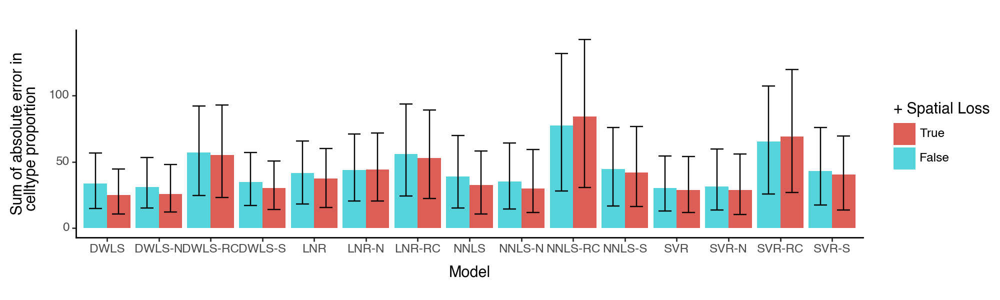

<Figure Size: (1000 x 300)>

In [16]:
(
    ggplot(abs_error, aes(x='deconv_model', y = 'abs_error', group = 'model')) +
    geom_bar(aes(fill = 'spatial_loss_class'),
                position = "dodge", stat = "summary",
                fun_y = np.mean) +
    geom_errorbar(stat = "summary", position = position_dodge(width=0.9)) +
    labs(x = 'Model', y = 'Sum of absolute error in\n celltype proportion', fill = '+ Spatial Loss') +
    theme_classic() +
    theme(figure_size = (10, 3))
)

/Users/jysumac/miniforge3/envs/smoother/lib/python3.10/site-packages/plotnine/themes/themeable.py:1902: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This paramater will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


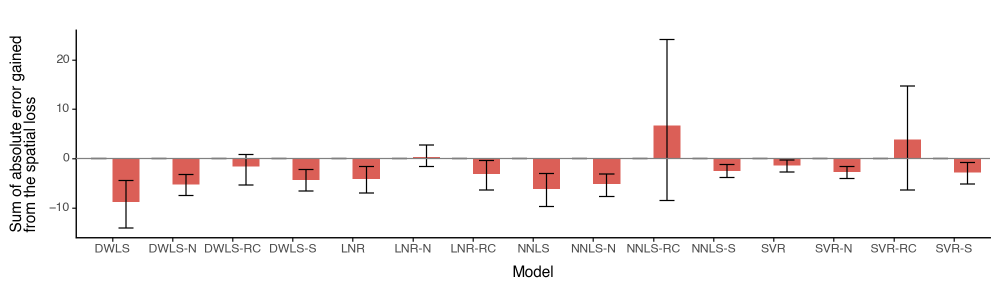

<Figure Size: (1000 x 300)>

In [17]:
df = abs_error.sort_values(by = ['cell_type', 'deconv_model'])
df_diff_err = df[['cell_type', 'deconv_model', 'spatial_loss', 'spatial_loss_class', 'model']]
df_diff_err['err_diff'] = df['abs_error'].to_numpy() - \
    np.repeat(df[~df.spatial_loss]['abs_error'].to_numpy(), 2)

ggplot(df_diff_err, aes(x='deconv_model', y = 'err_diff', fill = 'spatial_loss', group = 'model')) + \
    geom_bar(aes(fill = 'spatial_loss_class'),
                position = "dodge", stat = "summary",
                fun_y = np.mean) + \
    geom_errorbar(stat = "summary", position = position_dodge(width=0.9)) + \
    geom_hline(yintercept = 0, color = 'gray') + \
    labs(x = 'Model', y = 'Sum of absolute error gained\nfrom the spatial loss', fill = 'Has spatial loss') + \
    theme_classic() + \
        theme(figure_size = (10, 3), subplots_adjust={'wspace': 0.25}, legend_position='none')

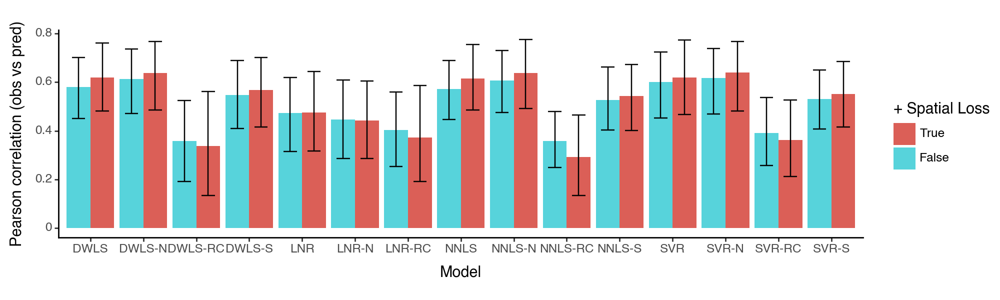

<Figure Size: (1000 x 300)>

In [18]:
ggplot(corr_df, aes(x='deconv_model', y = 'pearson_r', group = 'model')) + \
    geom_bar(aes(fill = 'spatial_loss_class'),
                position = "dodge", stat = "summary",
                fun_y = np.mean) + \
    geom_errorbar(stat = "summary", position = position_dodge(width=0.9)) + \
    labs(x = 'Model', y = 'Pearson correlation (obs vs pred)', fill = '+ Spatial Loss') + \
    theme_classic() + \
    theme(figure_size = (10, 3))

/Users/jysumac/miniforge3/envs/smoother/lib/python3.10/site-packages/plotnine/themes/themeable.py:1902: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This paramater will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


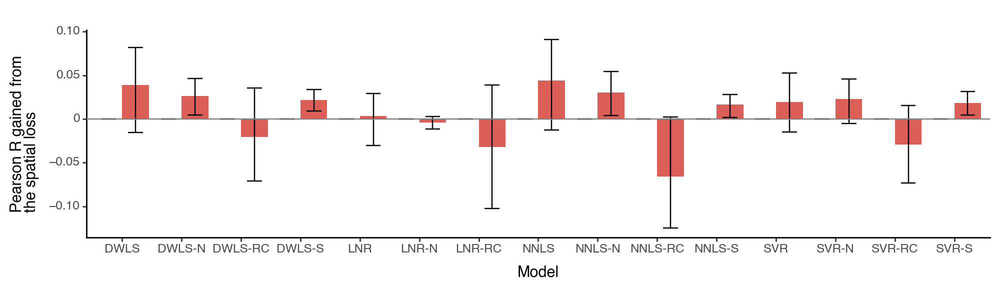

<Figure Size: (1000 x 300)>

In [19]:
df = corr_df.sort_values(by = ['cell_type', 'deconv_model'])
df_diff_corr = df[['cell_type', 'deconv_model', 'spatial_loss', 'spatial_loss_class', 'model']]
df_diff_corr['r_diff'] = df['pearson_r'].to_numpy() - \
    np.repeat(df[~df.spatial_loss]['pearson_r'].to_numpy(), 2)

ggplot(df_diff_corr, aes(x='deconv_model', y = 'r_diff', fill = 'spatial_loss', group = 'model')) + \
    geom_bar(aes(fill = 'spatial_loss_class'),
                position = "dodge", stat = "summary",
                fun_y = np.mean) + \
    geom_errorbar(stat = "summary", position = position_dodge(width=0.9)) + \
    geom_hline(yintercept = 0, color = 'gray') + \
    labs(x = 'Model', y = 'Pearson R gained from\nthe spatial loss', fill = 'Has spatial loss') + \
    theme_classic() + \
    theme(figure_size = (10, 3), subplots_adjust={'wspace': 0.25}, legend_position='none')

## Deconvolute all 14 slides

### Run deconvolution for torch models

In [3]:
def deconv_all_slides_torch(data_dir, num_slides = 14):
    torch.manual_seed(20220801)

    p_inf_s_list = []
    runtime_s_list = []
    method_names = ['NNLS', 'NNLS + spatial',
                    'SVR', 'SVR + spatial',
                    'DWLS', 'DWLS + spatial',
                    'LNR', 'LNR + spatial']

    # reference count matrices
    ref_norm_counts = pd.read_csv(
        f"{data_dir}/ref_avg_norm_count_markers.csv", header = 0, index_col = 0)

    # convert data into torch tensor
    x_norm_c = torch.tensor(ref_norm_counts.values).float()
    x_norm_lc = torch.log1p(x_norm_c)

    for s in range(num_slides):
        print(f"Deconvoluting slide {s + 1} ...")
        
        # spatial coordinates, num_spot x 2
        meta = pd.read_csv(f"{data_dir}/slide_{s+1}/meta_grids.csv", sep = ",", header=0, index_col=0)
        coords = meta.loc[:, ['Row', 'Col']]

        # log-scale count matrices
        sp_counts = sio.mmread(
            f"{data_dir}/slide_{s+1}/syn_sp_count_markers.mtx"
        ).toarray().T
    
        # convert data into torch tensor
        y_c = torch.tensor(sp_counts).float()
        y_lc = torch.log1p(y_c)

        # calculate spatial weight matrix
        weights = SpatialWeightMatrix()
        weights.calc_weights_knn(coords)
        weights.scale_by_expr(y_lc)

        spatial_loss = SpatialLoss('icar', weights, rho = 0.99)

        deconv_configs = {'max_epochs':-1, 'lr':3e-3, 'quiet':True}

        # NNLS
        nnls_wo_ss = NNLS()
        nnls_wo_ss.deconv(x_norm_lc, y_lc, None, lambda_spatial_loss=0, **deconv_configs)
        nnls_w_ss = NNLS()
        nnls_w_ss.deconv(x_norm_lc, y_lc, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

        # Nu-SVR
        svr_wo_ss = NuSVR(nu=0.5, nonneg=True)
        svr_wo_ss.deconv(x_norm_lc, y_lc, None, lambda_spatial_loss=0, **deconv_configs)
        svr_w_ss = NuSVR(nu=0.5, nonneg=True)
        svr_w_ss.deconv(x_norm_lc, y_lc, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

        # DWLS
        dwls_wo_ss = DWLS(nonneg=True, max_weights=4)
        dwls_wo_ss.deconv(x_norm_lc, y_lc, None, lambda_spatial_loss=0, **deconv_configs)
        dwls_w_ss = DWLS(nonneg=True, max_weights=4)
        dwls_w_ss.deconv(x_norm_lc, y_lc, spatial_loss, lambda_spatial_loss=3, **deconv_configs)

        # LogNormRegression
        lnr_wo_ss = LogNormReg()
        lnr_wo_ss.deconv(x_norm_c, y_c, None, lambda_spatial_loss=0, **deconv_configs)
        lnr_w_ss = LogNormReg()
        lnr_w_ss.deconv(x_norm_c, y_c, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

        # merge
        deconv_models = [nnls_wo_ss, nnls_w_ss,
                         svr_wo_ss, svr_w_ss,
                         dwls_wo_ss, dwls_w_ss,
                         lnr_wo_ss, lnr_w_ss]

        # extract celltype proportions
        prop_inf = [m.get_props().numpy() for m in deconv_models]
        p_inf_s_list.append(np.stack(prop_inf))
        
        # extract runtime
        runtime = [m.deconv_time for m in deconv_models]
        runtime_s_list.append(np.stack(runtime))

    return method_names, p_inf_s_list, runtime_s_list

def save_deconv_results(res_dir, p_inf_s_list, runtime_s_list):
    if not os.path.exists(res_dir):
        os.makedirs(res_dir)
    
    assert len(p_inf_s_list) == len(runtime_s_list)
    
    methods = ['nnls', 'nnls_sp', 'svr', 'svr_sp',
               'dwls', 'dwls_sp', 'lnr', 'lnr_sp']
    
    runtime_df = pd.DataFrame(np.stack(runtime_s_list), columns=methods)
    runtime_df.to_csv(res_dir + "/runtime.csv")
    
    num_slides = len(p_inf_s_list)
    for s in range(num_slides):
        for m, name in enumerate(methods):
            np.savetxt(res_dir + f"/{name}_s{s + 1}.txt", p_inf_s_list[s][m,:,:])

In [4]:
method_names, p_inf_s_list, runtime_s_list = deconv_all_slides_torch(DATA_FOLDER, num_slides=14)
save_deconv_results(RES_FOLDER + '/torch/', p_inf_s_list, runtime_s_list)

Deconvoluting slide 1 ...
Number of spots: 814. Average number of neighbors per spot:  4.94.
Number of spots: 814. Average number of neighbors per spot:  4.95.
Deconvoluting slide 2 ...
Number of spots: 1043. Average number of neighbors per spot:  4.95.
Number of spots: 1043. Average number of neighbors per spot:  4.95.
Deconvoluting slide 3 ...
Number of spots: 895. Average number of neighbors per spot:  5.02.
Number of spots: 895. Average number of neighbors per spot:  5.03.
Deconvoluting slide 4 ...
Number of spots: 1040. Average number of neighbors per spot:  4.99.
Number of spots: 1040. Average number of neighbors per spot:  4.99.
Deconvoluting slide 5 ...
Number of spots: 629. Average number of neighbors per spot:  4.92.
Number of spots: 629. Average number of neighbors per spot:  4.92.
Deconvoluting slide 6 ...
Number of spots: 960. Average number of neighbors per spot:  5.02.
Number of spots: 960. Average number of neighbors per spot:  5.03.
Deconvoluting slide 7 ...
Number of 

### Evaluate deconvolution accuracy

In [5]:
def load_deconv_results(data_dir, res_dir, num_slides = 14):
    # load reference expression profiles
    # reference count matrices
    ref_norm_counts = pd.read_csv(
        f"{data_dir}/ref_avg_norm_count_markers.csv", header = 0, index_col = 0)
    celltypes = ref_norm_counts.columns

    coords = []
    p_true_s_list = []
    
    for s in range(num_slides):
        # spatial coordinates, num_spot x 2
        meta = pd.read_csv(data_dir + f"/slide_{s+1}/meta_grids.csv", sep = ",", header=0, index_col=0)
        coords.append(meta.loc[:, ['Row', 'Col']])

        p_true_s = meta.loc[:, celltypes].to_numpy() / (meta['total'].to_numpy()[:, None] + 1e-10)
        p_true_s_list.append(p_true_s)

    # load deconvolution results
    file_names = ['torch/' + n for n in ['nnls', 'nnls_sp', 'svr', 'svr_sp',
                                         'dwls', 'dwls_sp', 'lnr', 'lnr_sp']]
    file_names += ['card/' + n for n in ['card', 'card_sp']]

    # [n_methods x n_spots x n_celltypes, ...]
    p_inf_s_list = [
        np.stack([np.loadtxt(f"{res_dir}/{name}_s{s + 1}.txt") for name in file_names])
        for s in range(num_slides)]
    
    return p_true_s_list, p_inf_s_list, celltypes, coords


def _array2df(array, value_name, method_names, celltypes):
    # array: n_celltypes x n_methods
    df = pd.DataFrame(array, columns = method_names)
    df['cell_type'] = celltypes
    df = pd.melt(
        df, id_vars=['cell_type'],
        var_name='model', value_name=value_name
    )
    df['spatial_loss'] = df['model'].str.contains('spatial')
    df['spatial_loss_cat'] = pd.Categorical(df.spatial_loss, [True, False])
    df['deconv_model'] = df['model'].str.split('+').str[0].str.strip()
    
    return df

def calc_deconv_stats(p_true_s_list, p_inf_s_list, celltypes, method_names, 
                      corr_metric = 'pearson', accu_metric = 'pr', is_present_threshold = 0.05):
    err_s_df = [] # absolute deconv error
    corr_s_df = [] # deconv correlation
    accu_s_df = [] # binary accuracy metric

    # check correlation metric
    assert corr_metric in ['pearson', 'spearman']
    if corr_metric == 'pearson':
        corr_func = lambda p_true, p_inf: np.corrcoef(p_true, p_inf)[0,1]
    else:
        corr_func = lambda p_true, p_inf: sp.stats.spearmanr(p_true, p_inf).correlation
    
    # check binary accuracy metric
    assert accu_metric in ['roc', 'pr']
    if accu_metric == 'roc':
        _accu_func = roc_auc_score
    else:
        _accu_func = average_precision_score
        
    def accu_func(y_true, y_inf, **kwargs):
        try:
            return _accu_func(y_true, y_inf, average='micro', **kwargs)
        except ValueError as verr:
            #print(f"Return NaN accuracy because of the following error: {verr}")
            return np.nan
    
    # iterate over experiments        
    for s, (p_true_s, p_inf_s) in enumerate(zip(p_true_s_list, p_inf_s_list)):
        # calculate mean square error of cell type proportions
        err_df = np.stack([((p_true_s - p_inf_s[model,:,:]) ** 2).mean(axis=0) 
                           for model in range(p_inf_s.shape[0])], axis=1)
        err_df = _array2df(err_df, 'mse', method_names, celltypes)
        err_df['slide'] = s
        err_s_df.append(err_df)

        # calculate pearson correlation between true and predicted
        corr_df = np.stack(
            [np.array([corr_func(p_true_s[:,i].flatten(), p_inf_m[:, i].flatten())
                       for i in range(p_true_s.shape[1])])
             for p_inf_m in p_inf_s], axis = 1)
        corr_df = _array2df(corr_df, 'corr', method_names, celltypes)
        corr_df['slide'] = s
        corr_s_df.append(corr_df)

        # calculate binary prediction accuracy
        is_ct_present = p_true_s >= is_present_threshold
        accu_df = np.stack(
            [np.array([accu_func(is_ct_present[:,i].flatten(), p_inf_m[:, i].flatten())
                       for i in range(p_true_s.shape[1])])
             for p_inf_m in p_inf_s], axis = 1)
        accu_df = _array2df(accu_df, 'accu', method_names, celltypes)
        accu_df['slide'] = s
        accu_s_df.append(accu_df)
        
    err_s_df = pd.concat(err_s_df)
    corr_s_df = pd.concat(corr_s_df)
    accu_s_df = pd.concat(accu_s_df)
    
    return err_s_df, corr_s_df, accu_s_df

In [6]:
method_names = ['NNLS', 'NNLS + spatial', 
                'SVR', 'SVR + spatial', 
                'DWLS', 'DWLS + spatial',
                'LNR', 'LNR + spatial']
method_names += ['CARD', 'CARD + spatial']

corr_metric='pearson'
accu_metric='pr'

# load deconv results
p_true_s_list, p_inf_s_list, celltypes, coords = load_deconv_results(DATA_FOLDER, RES_FOLDER)

# calculate performance stats
with warnings.catch_warnings():
    warnings.filterwarnings("ignore")
    err_s_df, corr_s_df, accu_s_df  = calc_deconv_stats(
        p_true_s_list, p_inf_s_list, celltypes, method_names, corr_metric, accu_metric)

def _order_method(df):
    df['deconv_model'] = pd.Categorical(df.deconv_model,
                                       ['NNLS', 'DWLS', 'SVR', 'LNR', 'CARD'])
    return df

err_s_df = _order_method(err_s_df)
corr_s_df = _order_method(corr_s_df)
accu_s_df = _order_method(accu_s_df)

### Accuracy

#### Mean square error

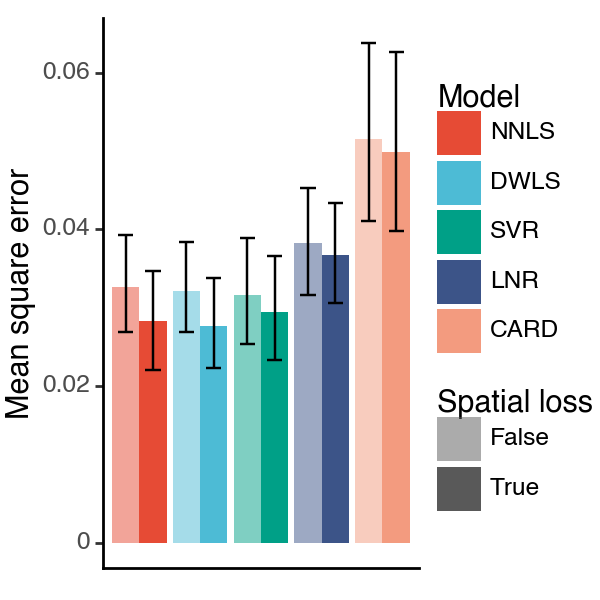

<Figure Size: (300 x 300)>

In [8]:
ggplot(err_s_df, aes(x='deconv_model', y = 'mse', group = 'model')) + \
    geom_bar(aes(alpha = 'spatial_loss', fill = 'deconv_model'),
                position = "dodge", stat = "summary",
                fun_y = np.mean) + \
    scale_fill_npg() + \
    scale_alpha_manual([0.5,1]) + \
    geom_errorbar(stat = "summary", position = position_dodge(width=0.9)) + \
    labs(x = '', y = 'Mean square error',
            fill = 'Model', alpha = 'Spatial loss') + \
    theme_classic() + \
    theme(figure_size = (3,3), 
             axis_text_x=element_blank(),
             axis_ticks_major_x=element_blank())

In [9]:
df = err_s_df.sort_values(by = ['cell_type', 'deconv_model', 'slide'])
df_diff_err = df[['cell_type', 'deconv_model', 'slide', 'spatial_loss']]
df_diff_err['err_diff'] = df['mse'].to_numpy() - \
    np.repeat(df[~df.spatial_loss]['mse'].to_numpy(), 2)
df_diff_err = df_diff_err[df_diff_err.spatial_loss]

/var/folders/_f/m4v2g8c54gdfks59bp2f2cm80000gn/T/ipykernel_20523/1326677585.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


/Users/jysumac/miniforge3/envs/smoother/lib/python3.10/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_boxplot : Removed 2 rows containing non-finite values.


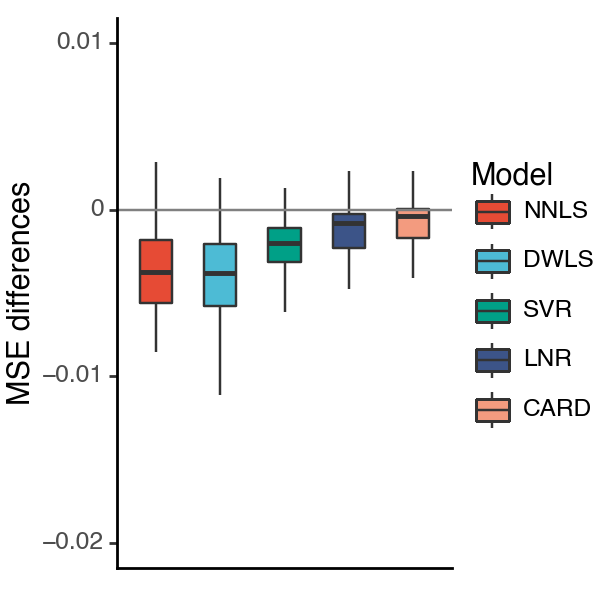

<Figure Size: (300 x 300)>

In [11]:
(
    ggplot(df_diff_err, 
                aes(x='deconv_model', y = 'err_diff', group = 'deconv_model')) + \
    geom_boxplot(aes(fill = 'deconv_model'), width = 0.5, outlier_shape = '') + \
    geom_hline(yintercept = 0, color = 'gray') + \
    scale_fill_npg() + \
    labs(x = '', y = 'MSE differences', fill = 'Model') + \
    theme_classic() + \
    scale_y_continuous(limits = [-0.02, 0.01]) + \
    theme(figure_size = (3, 3), 
             axis_text_x=element_blank(),
             axis_ticks_major_x=element_blank())
)


#### Pearson R

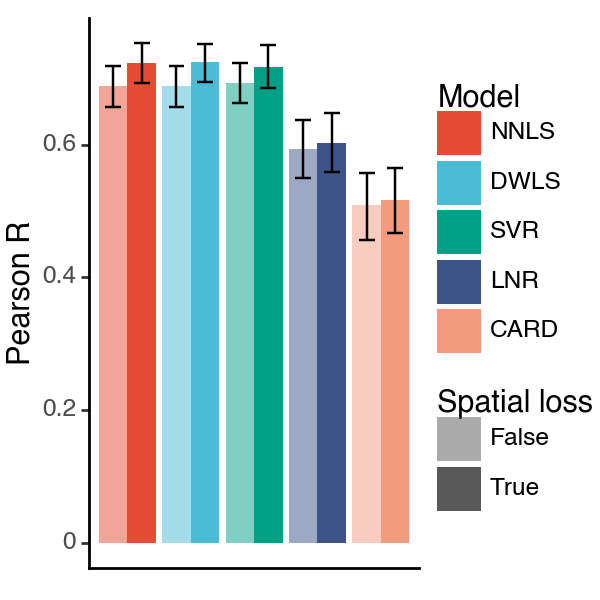

<Figure Size: (300 x 300)>

In [12]:
ggplot(corr_s_df, 
          aes(x='deconv_model', y = 'corr', group = 'model')) + \
    geom_bar(aes(alpha = 'spatial_loss', fill = 'deconv_model'),
                position = "dodge", stat = "summary",
                fun_y = np.mean) + \
    scale_fill_npg() + \
    scale_alpha_manual([0.5,1]) + \
    geom_errorbar(stat = "summary", position = position_dodge(width=0.9)) + \
    labs(x = '', y = 'Pearson R',
            fill = 'Model', alpha = 'Spatial loss') + \
    theme_classic() + \
    theme(figure_size = (3, 3), 
             axis_text_x=element_blank(),
             axis_ticks_major_x=element_blank())

In [13]:
df = corr_s_df.sort_values(by = ['cell_type', 'deconv_model', 'slide'])
df_diff_corr = df[['cell_type', 'deconv_model', 'slide', 'spatial_loss']]
df_diff_corr['corr_diff'] = df['corr'].to_numpy() - \
    np.repeat(df[~df.spatial_loss]['corr'].to_numpy(), 2)
df_diff_corr = df_diff_corr[df_diff_corr.spatial_loss]

/var/folders/_f/m4v2g8c54gdfks59bp2f2cm80000gn/T/ipykernel_20523/3558571529.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


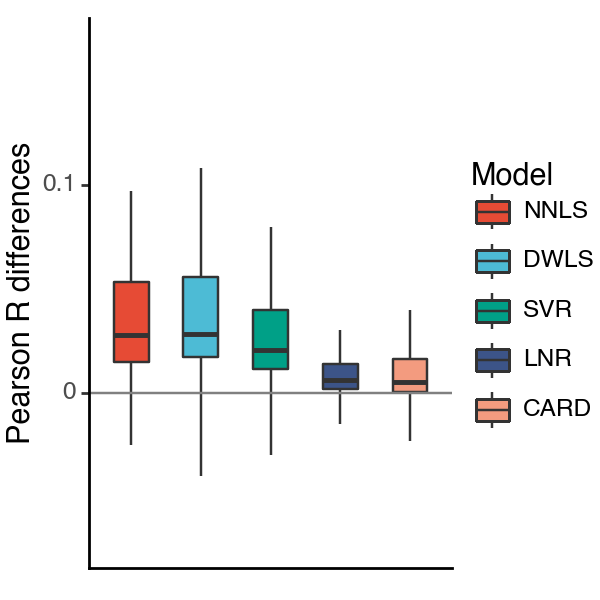

<Figure Size: (300 x 300)>

In [15]:
ggplot(
    df_diff_corr, 
    aes(x='deconv_model', y = 'corr_diff', group = 'deconv_model')
) + \
    geom_boxplot(aes(fill = 'deconv_model'), width = 0.5, outlier_shape = '') + \
    geom_hline(yintercept = 0, color = 'gray') + \
    scale_fill_npg() + \
    labs(x = '', y = 'Pearson R differences', fill = 'Model') + \
    theme_classic() + \
    scale_y_continuous() + \
    theme(figure_size = (3, 3), 
             axis_text_x=element_blank(),
             axis_ticks_major_x=element_blank())


### Binary accuracy

#### Average precision scores

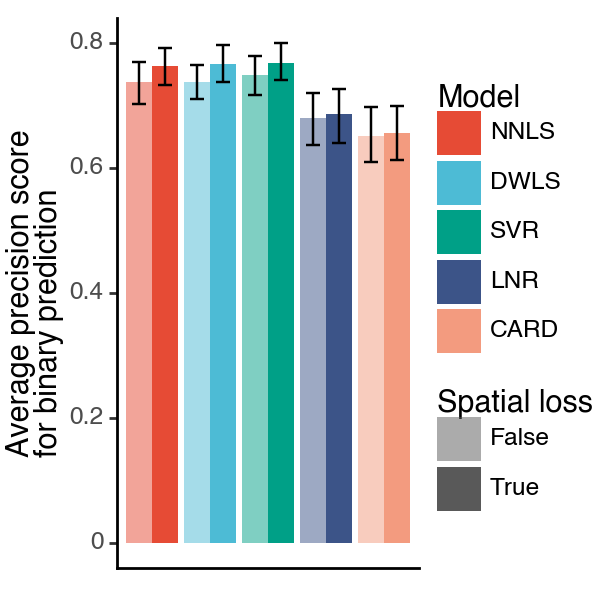

<Figure Size: (300 x 300)>

In [16]:
ggplot(accu_s_df, 
          aes(x='deconv_model', y = 'accu', group = 'model')) + \
    geom_bar(aes(alpha = 'spatial_loss', fill = 'deconv_model'),
                position = "dodge", stat = "summary",
                fun_y = np.mean) + \
    scale_fill_npg() + \
    scale_alpha_manual([0.5,1]) + \
    geom_errorbar(stat = "summary", position = position_dodge(width=0.9)) + \
    labs(x = '', y = 'Average precision score\nfor binary prediction',
            fill = 'Model', alpha = 'Spatial loss') + \
    theme_classic() + \
    theme(figure_size = (3, 3), 
             axis_text_x=element_blank(),
             axis_ticks_major_x=element_blank())

In [17]:
df = accu_s_df.sort_values(by = ['cell_type', 'deconv_model', 'slide'])
df_diff_accu = df[['cell_type', 'deconv_model', 'slide', 'spatial_loss']]
df_diff_accu['accu_diff'] = df['accu'].to_numpy() - \
    np.repeat(df[~df.spatial_loss]['accu'].to_numpy(), 2)
df_diff_accu = df_diff_accu[df_diff_accu.spatial_loss]

/var/folders/_f/m4v2g8c54gdfks59bp2f2cm80000gn/T/ipykernel_20523/2319495894.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


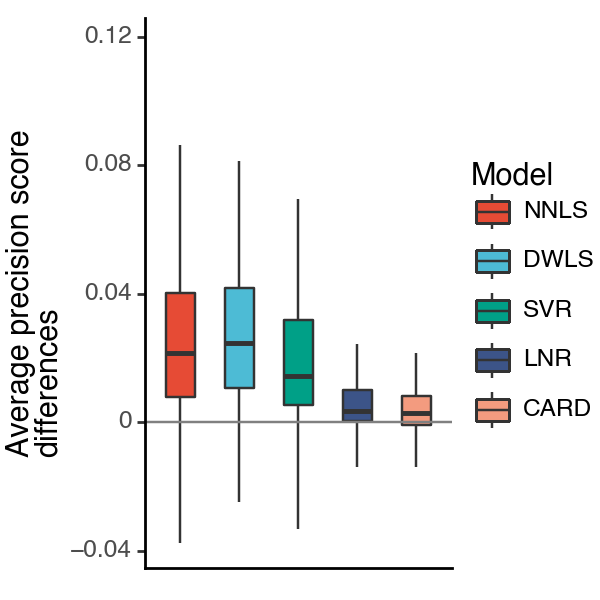

<Figure Size: (300 x 300)>

In [18]:
(
    ggplot(df_diff_accu, 
                aes(x='deconv_model', y = 'accu_diff', group = 'deconv_model')) +
    geom_boxplot(aes(fill = 'deconv_model'), width = 0.5, outlier_shape = '') +
    geom_hline(yintercept = 0, color = 'gray') +
    labs(x = '', y = 'Average precision score\ndifferences', fill = 'Model') +
    scale_fill_npg() +
    theme_classic() +
    scale_y_continuous() +
    theme(figure_size = (3, 3), 
             axis_text_x=element_blank(),
             axis_ticks_major_x=element_blank())
)
